# Car Price Dataset

<img src="https://images.unsplash.com/photo-1493238792000-8113da705763?fm=jpg&q=60&w=3000&ixlib=rb-4.1.0&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8Y2FyJTIwd2FsbHBhcGVyfGVufDB8fDB8fHww" height='500' width='1280' alt="Car Price Dataset" >

---

### 👨‍💻 Author: **Abdul Samad**

- 🔗 **LinkedIn:** [abdulsamad577](https://www.linkedin.com/in/abdulsamad577/)  
- 🧠 **Kaggle:** [samad0015](https://www.kaggle.com/samad0015)     
- 📅 **Date:** May 2025

---


## 1. About Dataset

This dataset contains information about various cars, including their specifications and prices. It can be used for predictive modeling, such as **price prediction**, **feature importance analysis**, and **market trend evaluation**.

---

### 🔑 Features Description

- **model**: The specific car model.  
- **year**: Year of manufacture.  
- **price**: The selling price of the car (**target variable**).  
- **transmission**: Type of transmission (Manual, Automatic, Semi-Auto, etc.).  
- **mileage**: The total distance the car has traveled in miles.  
- **fuelType**: Type of fuel used (Petrol, Diesel, Hybrid, etc.).  
- **tax**: Road tax amount for the car.  
- **mpg**: Miles per gallon (fuel efficiency).  
- **engineSize**: The engine capacity in liters.  
- **Manufacturer**: The brand or manufacturer of the car.  

---

### 📌 Potential Use Cases

- **Car Price Prediction**: Train a machine learning model to predict car prices based on various features.  
- **Feature Importance Analysis**: Identify which factors influence the price the most.  
- **Market Analysis**: Analyze trends in car prices over different years, brands, and specifications.  
- **Fuel Efficiency Comparison**: Compare cars based on mileage and fuel type to find the most efficient options.  

---

This dataset is ideal for **machine learning practitioners**, **data analysts**, and **automotive market researchers**.


## 2. Import Libraries

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from IPython.display import display
import warnings
warnings.filterwarnings('ignore')

## 3. Data Loading and Initial Exploration

In [2]:
df=pd.read_csv('cars_data.csv')
df.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,Manufacturer
0,I10,2017,7495.0,Manual,11630,Petrol,145,60.1,1.0,hyundi
1,Polo,2017,10989.0,Manual,9200,Petrol,145,58.9,1.0,volkswagen
2,2 Series,2019,27990.0,Semi-Auto,1614,Diesel,145,49.6,2.0,BMW
3,Yeti Outdoor,2017,12495.0,Manual,30960,Diesel,150,62.8,2.0,skoda
4,Fiesta,2017,7999.0,Manual,19353,Petrol,125,54.3,1.2,ford


In [3]:
df.shape

(97712, 10)

In [4]:
df.dtypes

model            object
year              int64
price           float64
transmission     object
mileage           int64
fuelType         object
tax               int64
mpg             float64
engineSize      float64
Manufacturer     object
dtype: object

In [5]:
df.columns

Index(['model', 'year', 'price', 'transmission', 'mileage', 'fuelType', 'tax',
       'mpg', 'engineSize', 'Manufacturer'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97712 entries, 0 to 97711
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         97712 non-null  object 
 1   year          97712 non-null  int64  
 2   price         96727 non-null  float64
 3   transmission  97712 non-null  object 
 4   mileage       97712 non-null  int64  
 5   fuelType      93586 non-null  object 
 6   tax           97712 non-null  int64  
 7   mpg           94256 non-null  float64
 8   engineSize    97712 non-null  float64
 9   Manufacturer  97712 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 7.5+ MB


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
year,97712.0,2017.066502,2.118661,1970.0,2016.0,2017.0,2019.0,2024.0
price,96727.0,16774.299823,9874.715050,450.0,9999.0,14471.0,20750.0,159999.0
mileage,97712.0,23219.475499,21060.882301,1.0,7673.0,17682.5,32500.0,323000.0
tax,97712.0,120.142408,63.357250,0.0,125.0,145.0,145.0,580.0
mpg,94256.0,55.228326,16.296400,0.3,47.1,54.3,62.8,470.8
engineSize,97712.0,1.664913,0.558574,0.0,1.2,1.6,2.0,6.6


In [8]:
# ...existing code...
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
# ...existing code...

fuelType        4.222613
mpg             3.536925
price           1.008065
model           0.000000
year            0.000000
transmission    0.000000
mileage         0.000000
tax             0.000000
engineSize      0.000000
Manufacturer    0.000000
dtype: float64

## 4. Exploratory Data Analysis (EDA)

>### Data Distribution

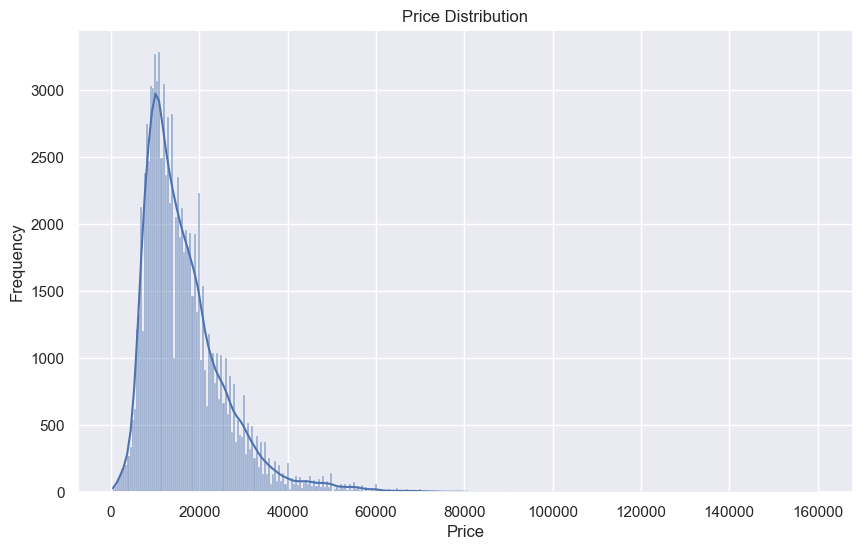

In [9]:
plt.figure(figsize=(10, 6))
sns.set(style="darkgrid")
sns.histplot(df['price'], kde=True)
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

### Correlation Matrix

In [10]:
df.corr(numeric_only=True)['price'].sort_values(ascending=False)


price         1.000000
engineSize    0.639612
year          0.492507
tax           0.307025
mpg          -0.293708
mileage      -0.417827
Name: price, dtype: float64

In [11]:
correlations = df.corr(numeric_only=True)['price'].sort_values(ascending=False).reset_index()
correlations.columns = ['Feature', 'Correlation']

# Bar plot with color based on correlation sign
fig = px.bar(
    correlations,
    x='Feature',
    y='Correlation',
    color='Correlation',
    color_continuous_scale='RdBu',
    title='🔍 Feature Correlation with Car Price',
    text='Correlation',
)

# Update layout and aesthetics
fig.update_layout(
    xaxis_title='Features',
    yaxis_title='Correlation with Price',
    height=600,
    title_x=0.5,
    coloraxis_colorbar=dict(title="Correlation"),
    plot_bgcolor='white',
    # xaxis_tickangle=45,
    font=dict(size=14),
)

# Format text and bar width
fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside',
    marker_line_color='black',
    marker_line_width=1.5
)

fig.show()


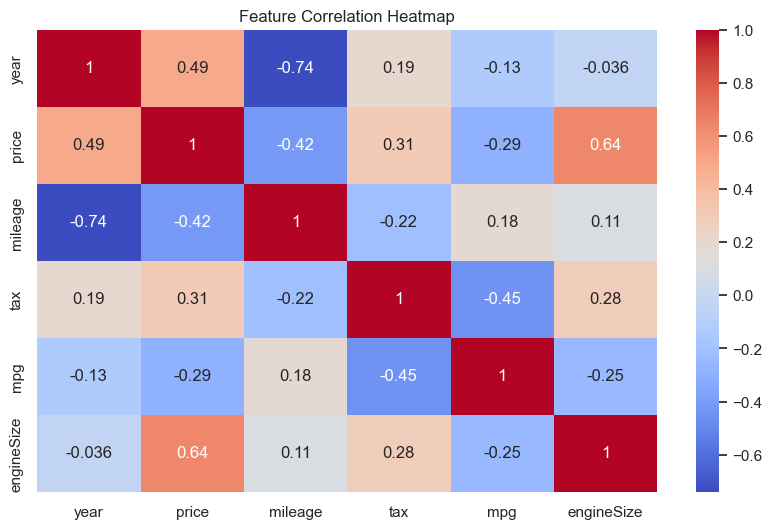

In [12]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()


### Visualization of Features

>### Categorical Features Analysis

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97712 entries, 0 to 97711
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         97712 non-null  object 
 1   year          97712 non-null  int64  
 2   price         96727 non-null  float64
 3   transmission  97712 non-null  object 
 4   mileage       97712 non-null  int64  
 5   fuelType      93586 non-null  object 
 6   tax           97712 non-null  int64  
 7   mpg           94256 non-null  float64
 8   engineSize    97712 non-null  float64
 9   Manufacturer  97712 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 7.5+ MB


In [14]:
df['model'].value_counts()

model
 Fiesta     6509
 Golf       4797
 Focus      4555
 C Class    3694
 Corsa      3285
            ... 
E Class        1
200            1
 Ranger        1
180            1
220            1
Name: count, Length: 196, dtype: int64

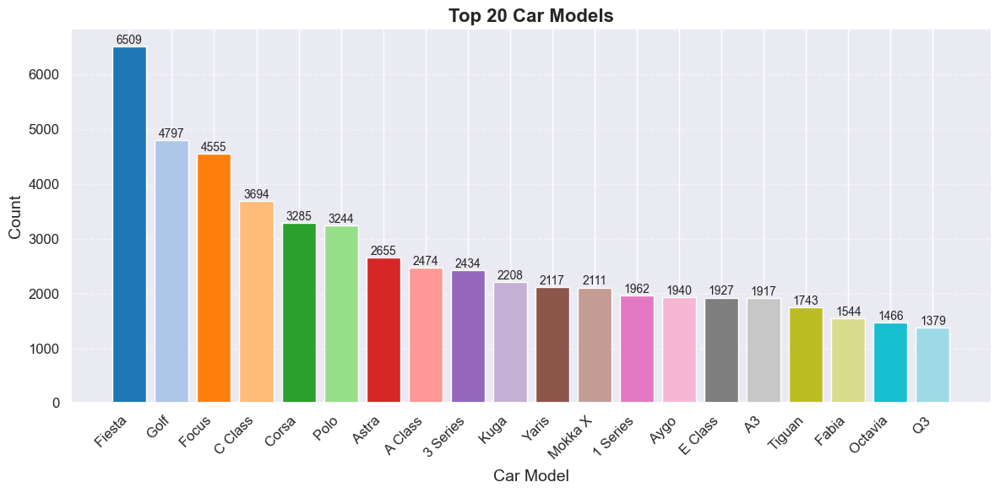

In [15]:
top_models = df['model'].value_counts().head(20)

# Set color palette (20 unique colors)
colors = sns.color_palette('tab20', len(top_models))

# Plot
plt.figure(figsize=(12, 6))
bars = plt.bar(top_models.index, top_models.values, color=colors)

# Add count labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 2, f'{height}', 
             ha='center', va='bottom', fontsize=10)

# Titles and labels
plt.title('Top 20 Car Models', fontsize=16, fontweight='bold')
plt.xlabel('Car Model', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [16]:
df['transmission'].value_counts()

transmission
Manual       55502
Semi-Auto    22296
Automatic    19905
Other            9
Name: count, dtype: int64

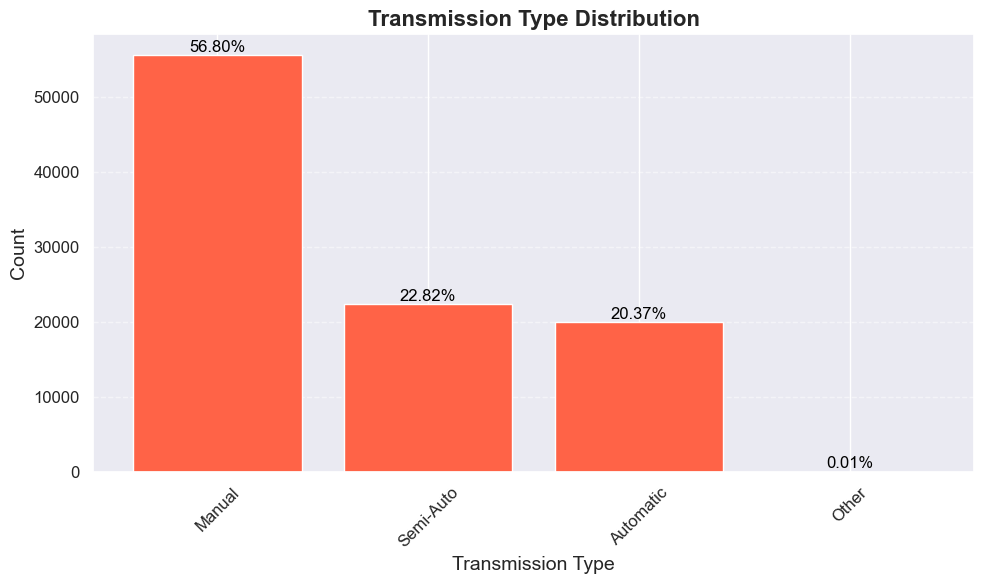

In [17]:
trans_counts = df['transmission'].value_counts()
trans_percent = trans_counts / trans_counts.sum() * 100

# Create bar plot
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(trans_counts.index, trans_counts.values, color='tomato')

# Add percentage labels on bars
for bar, percent in zip(bars, trans_percent):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height + 100, f'{percent:.2f}%', 
            ha='center', va='bottom', fontsize=12, color='black')

# Add titles and labels
ax.set_title('Transmission Type Distribution', fontsize=16, fontweight='bold')
ax.set_xlabel('Transmission Type', fontsize=14)
ax.set_ylabel('Count', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [18]:
df['fuelType'].value_counts()

fuelType
Petrol      51706
Diesel      38696
Hybrid       2938
Other         241
Electric        5
Name: count, dtype: int64

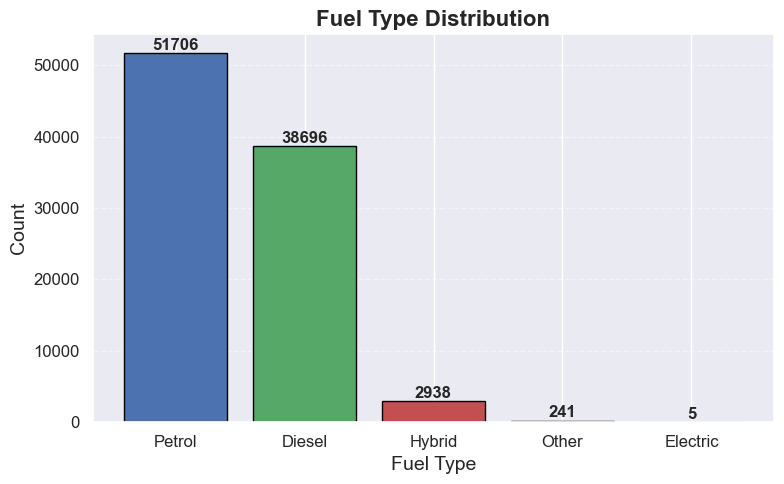

In [19]:
import matplotlib.pyplot as plt

# Get fuel type counts
fuel_counts = df['fuelType'].value_counts()

plt.figure(figsize=(8, 5))
bars = plt.bar(fuel_counts.index, fuel_counts.values, color=['#4C72B0', '#55A868', '#C44E52', '#8172B3', '#CCB974'], edgecolor='black')

# Add count labels on top of bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 10, f'{int(height)}', 
             ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.title('Fuel Type Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Fuel Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [20]:
df['Manufacturer'].value_counts()

Manufacturer
ford          17811
volkswagen    14893
vauxhall      13258
merc          12860
BMW           10664
Audi          10565
toyota         6699
skoda          6188
hyundi         4774
Name: count, dtype: int64

In [21]:

top_manufacturers = df['Manufacturer'].value_counts().head(15).reset_index()
top_manufacturers.columns = ['Manufacturer', 'Count']

# Plot
fig = px.bar(
    top_manufacturers,
    x='Manufacturer',
    y='Count',
    text='Count',
    color='Count',
    color_continuous_scale='Viridis',
    title='Top 15 Car Manufacturers',
    labels={'Count': 'Number of Cars', 'Manufacturer': 'Manufacturer'},
    height=500,
    width=900
)

fig.update_traces(textposition='outside')
fig.update_layout(
    xaxis_tickangle=-45,
    coloraxis_showscale=False,
    uniformtext_minsize=10,
    uniformtext_mode='hide',
    margin=dict(t=70, b=150)
)

fig.show()


>#### Comparison of Numerical Features

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97712 entries, 0 to 97711
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   model         97712 non-null  object 
 1   year          97712 non-null  int64  
 2   price         96727 non-null  float64
 3   transmission  97712 non-null  object 
 4   mileage       97712 non-null  int64  
 5   fuelType      93586 non-null  object 
 6   tax           97712 non-null  int64  
 7   mpg           94256 non-null  float64
 8   engineSize    97712 non-null  float64
 9   Manufacturer  97712 non-null  object 
dtypes: float64(3), int64(3), object(4)
memory usage: 7.5+ MB


In [23]:
fig = px.scatter(
    df,
    x='year',
    y='price',
    color='fuelType',
    title='💰 Car Price vs Year by Fuel Type',
    labels={'year': 'Manufacturing Year', 'price': 'Price', 'fuelType': 'Fuel Type'},
    opacity=0.7,
    color_discrete_sequence=px.colors.qualitative.Set1,
    hover_data=['model', 'transmission', 'mileage', 'engineSize']
)

fig.update_layout(
    height=600,
    width=950,
    legend_title='Fuel Type',
    title_font_size=20,
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgrey'),
    yaxis=dict(showgrid=True, gridcolor='lightgrey')
)

fig.show()


<Axes: xlabel='engineSize', ylabel='price'>

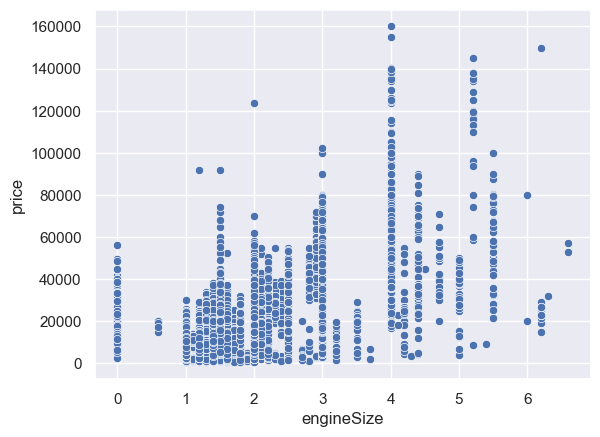

In [24]:
sns.scatterplot(df,x='engineSize',y='price')

In [25]:
df['engineSize'].describe()

count    97712.000000
mean         1.664913
std          0.558574
min          0.000000
25%          1.200000
50%          1.600000
75%          2.000000
max          6.600000
Name: engineSize, dtype: float64

In [26]:
df[df['engineSize']==0]

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,Manufacturer
449,i3,2017,19895.0,Automatic,29851,Hybrid,0,470.8,0.0,BMW
969,i3,2016,14900.0,Automatic,59945,Hybrid,0,470.8,0.0,BMW
1985,3 Series,2018,18000.0,Automatic,24240,Diesel,150,64.2,0.0,BMW
2219,Astra,2017,11000.0,Manual,14878,Petrol,145,51.4,0.0,vauxhall
3290,I10,2015,7500.0,Manual,13637,Petrol,30,57.6,0.0,hyundi
...,...,...,...,...,...,...,...,...,...,...
95623,Fiesta,2018,12999.0,Manual,15000,Petrol,150,58.9,0.0,ford
95625,I20,2017,11400.0,Automatic,12661,Petrol,145,44.1,0.0,hyundi
96910,Mondeo,2013,5328.0,Manual,105000,Diesel,30,65.7,0.0,ford
97033,I10,2016,6300.0,Manual,17272,Petrol,20,61.4,0.0,hyundi


> it is not possible to engineSize the car is being 0. So we can replace the 0 values with null values.

In [27]:
df['engineSize'].replace(0,np.nan,inplace=True)

### Handling Missing Values

In [28]:
(df.isnull().sum() / len(df) * 100).sort_values(ascending=False)

fuelType        4.222613
mpg             3.536925
price           1.008065
engineSize      0.274275
model           0.000000
year            0.000000
transmission    0.000000
mileage         0.000000
tax             0.000000
Manufacturer    0.000000
dtype: float64

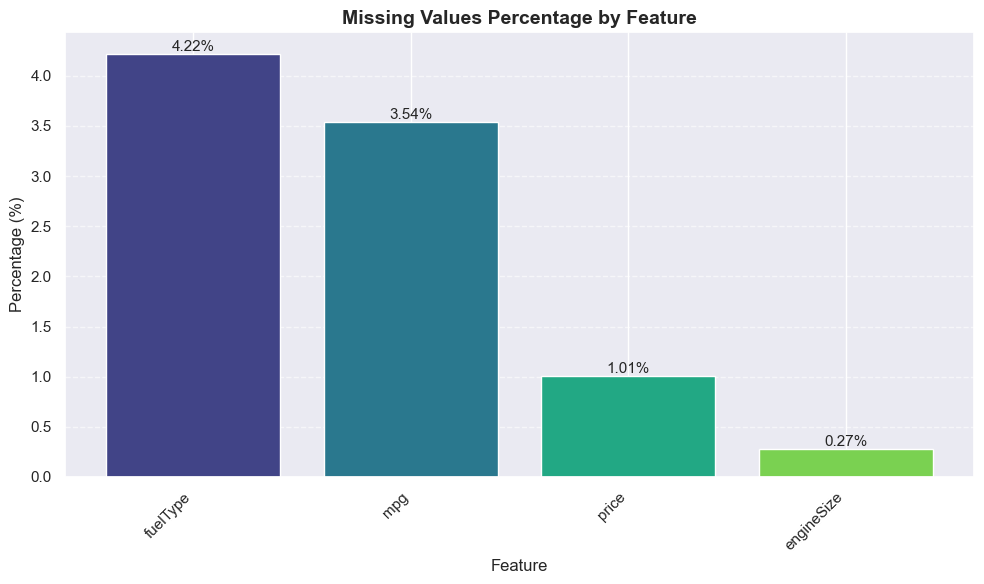

In [29]:
# Calculate missing value percentages
missing_values = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)
missing_values = missing_values[missing_values > 0]

# Create the bar plot
plt.figure(figsize=(10, 6))
colors = sns.color_palette("viridis", len(missing_values))
bars = plt.bar(missing_values.index, missing_values.values, color=colors)

# Add percentage labels on top
for bar, pct in zip(bars, missing_values.values):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
             f"{pct:.2f}%", ha='center', va='bottom', fontsize=11)

# Styling
plt.title('Missing Values Percentage by Feature', fontsize=14, fontweight='bold')
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Feature', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()

plt.show()


>#### 'Price' Column

In [30]:
df['price'].median()

14471.0

In [31]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
df['price'] = imputer.fit_transform(df[['price']])

>#### 'FuelType' Column

In [32]:
df['fuelType'].value_counts()

fuelType
Petrol      51706
Diesel      38696
Hybrid       2938
Other         241
Electric        5
Name: count, dtype: int64

In [33]:
cat_imputer=SimpleImputer(strategy='most_frequent')
df['fuelType'] = cat_imputer.fit_transform(df[['fuelType']])[:, 0]


>#### 'mpg' Column

In [34]:
df['mpg'].isnull().sum()

3456

In [35]:
df['mpg'].dtypes

dtype('float64')

In [36]:
df['mpg']=imputer.fit_transform(df[['mpg']])

>#### 'engineSize' Column

In [37]:
df['engineSize'].isnull().sum()

268

In [38]:
df['engineSize']=imputer.fit_transform(df[['engineSize']])

In [39]:
df.isnull().sum()

model           0
year            0
price           0
transmission    0
mileage         0
fuelType        0
tax             0
mpg             0
engineSize      0
Manufacturer    0
dtype: int64

>#### Now the Data has been cleaned from missing values.

## 5. Data Preprocessing

In [40]:
df.dtypes

model            object
year              int64
price           float64
transmission     object
mileage           int64
fuelType         object
tax               int64
mpg             float64
engineSize      float64
Manufacturer     object
dtype: object

In [41]:
le_model=LabelEncoder()
df['model'] = le_model.fit_transform(df['model'])

In [42]:
le_trans=LabelEncoder()
df['transmission'] = le_trans.fit_transform(df['transmission'])

In [43]:
le_fuel=LabelEncoder()
df['fuelType'] = le_fuel.fit_transform(df['fuelType'])

In [44]:
le_manu=LabelEncoder()
df['Manufacturer'] = le_manu.fit_transform(df['Manufacturer'])

In [45]:
df.dtypes

model             int32
year              int64
price           float64
transmission      int32
mileage           int64
fuelType          int32
tax               int64
mpg             float64
engineSize      float64
Manufacturer      int32
dtype: object

In [46]:
df.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,Manufacturer
0,81,2017,7495.0,1,11630,4,145,60.1,1.0,3
1,115,2017,10989.0,1,9200,4,145,58.9,1.0,8
2,1,2019,27990.0,3,1614,0,145,49.6,2.0,1
3,184,2017,12495.0,1,30960,0,150,62.8,2.0,5
4,60,2017,7999.0,1,19353,4,125,54.3,1.2,2


## 6. Splitting the Data

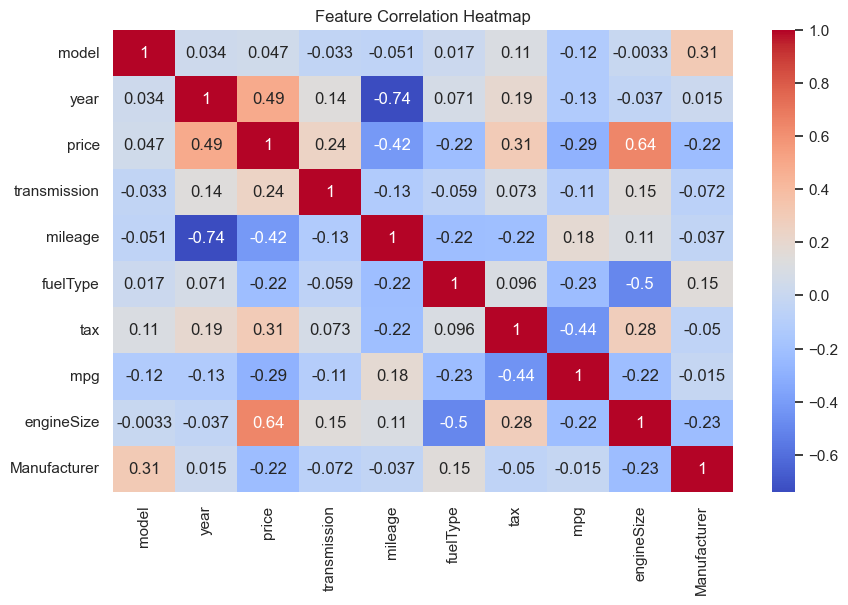

In [47]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()


> according to the correlation matrix, our target variable is very less correlate with 'model' column. So we can drop it.

In [48]:
df.drop(columns='model',inplace=True)

In [49]:
X=df.drop(columns='price')
y=df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## 7. Model Building

In [50]:
# Initialize an empty DataFrame to store results
results = pd.DataFrame(columns=['Model', 'MAE', 'RMSE', 'R2 Score'])

# Function to run a regression model, evaluate it, and store the results
def evaluate_regression_model(model, X_train, X_test, y_train, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = model.predict(X_test)
    
    # Calculate regression metrics
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    # Create a DataFrame with the results for this model
    model_results = pd.DataFrame({
        'Model': [model_name],
        'MAE': [mae],
        'RMSE': [rmse],
        'R2 Score': [r2]
    })
    
    # Append to the global results DataFrame
    global results
    results = pd.concat([results, model_results], ignore_index=True)
    if results.duplicated().any():
        results.drop_duplicates(inplace=True)


### Linear Regression

In [51]:

evaluate_regression_model(LinearRegression(), X_train, X_test, y_train, y_test, 'Linear regression')
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")



,Model,MAE,RMSE,R2 Score
0,Linear regression,3628.858279,5437.445726,0.683062


### Ridge Regression

In [52]:
evaluate_regression_model(Ridge(), X_train, X_test, y_train, y_test, 'Ridge Regression')

In [53]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Ridge Regression,3628.814133,5437.412692,0.683066
1,Linear regression,3628.858279,5437.445726,0.683062


### Decision Tree Regressor

In [54]:
evaluate_regression_model(DecisionTreeRegressor(), X_train, X_test, y_train, y_test, 'Decision Tree')

In [55]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Decision Tree,2192.934987,4041.801571,0.824881
1,Ridge Regression,3628.814133,5437.412692,0.683066
2,Linear regression,3628.858279,5437.445726,0.683062


### Lasso Regression

In [56]:
evaluate_regression_model(Lasso(), X_train, X_test, y_train, y_test, 'Lasso Regression')

In [57]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Decision Tree,2192.934987,4041.801571,0.824881
1,Lasso Regression,3628.546439,5437.129700,0.683099
2,Ridge Regression,3628.814133,5437.412692,0.683066
3,Linear regression,3628.858279,5437.445726,0.683062


### Elastic Net

In [58]:
evaluate_regression_model(ElasticNet(), X_train, X_test, y_train, y_test, 'ElasticNet')

In [59]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Decision Tree,2192.934987,4041.801571,0.824881
1,Lasso Regression,3628.546439,5437.129700,0.683099
2,Ridge Regression,3628.814133,5437.412692,0.683066
3,Linear regression,3628.858279,5437.445726,0.683062
4,ElasticNet,4171.643177,6482.998807,0.549457


### Random Forest

In [60]:
evaluate_regression_model(RandomForestRegressor(), X_train, X_test, y_train, y_test, 'Random Forest')

In [61]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Random Forest,1801.934071,3423.596105,0.874354
1,Decision Tree,2192.934987,4041.801571,0.824881
2,Lasso Regression,3628.546439,5437.129700,0.683099
3,Ridge Regression,3628.814133,5437.412692,0.683066
4,Linear regression,3628.858279,5437.445726,0.683062
5,ElasticNet,4171.643177,6482.998807,0.549457


### Gradient Boosting Regressor

In [62]:
evaluate_regression_model(GradientBoostingRegressor(), X_train, X_test, y_train, y_test, 'Gradient Boosting')

In [63]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Random Forest,1801.934071,3423.596105,0.874354
1,Gradient Boosting,2355.587235,3800.929216,0.845131
2,Decision Tree,2192.934987,4041.801571,0.824881
3,Lasso Regression,3628.546439,5437.129700,0.683099
4,Ridge Regression,3628.814133,5437.412692,0.683066
5,Linear regression,3628.858279,5437.445726,0.683062
6,ElasticNet,4171.643177,6482.998807,0.549457


### KNN

In [64]:
evaluate_regression_model(KNeighborsRegressor(), X_train, X_test, y_train, y_test, 'K-Nearest Neighbors')

In [65]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,Random Forest,1801.934071,3423.596105,0.874354
1,Gradient Boosting,2355.587235,3800.929216,0.845131
2,Decision Tree,2192.934987,4041.801571,0.824881
3,Lasso Regression,3628.546439,5437.129700,0.683099
4,Ridge Regression,3628.814133,5437.412692,0.683066
5,Linear regression,3628.858279,5437.445726,0.683062
6,ElasticNet,4171.643177,6482.998807,0.549457
7,K-Nearest Neighbors,4977.337195,7247.709859,0.436900


### XGBoost

In [66]:
evaluate_regression_model(XGBRegressor(), X_train, X_test, y_train, y_test, 'XGBoost')

In [67]:
results.sort_values(by='R2 Score', ascending=False).reset_index(drop=True).style \
    .background_gradient(cmap=sns.color_palette("ch:s=-.2,r=.6", as_cmap=True)) \
    .set_caption("📊 Model Evaluation Results")

,Model,MAE,RMSE,R2 Score
0,XGBoost,1860.119667,3313.981602,0.882271
1,Random Forest,1801.934071,3423.596105,0.874354
2,Gradient Boosting,2355.587235,3800.929216,0.845131
3,Decision Tree,2192.934987,4041.801571,0.824881
4,Lasso Regression,3628.546439,5437.129700,0.683099
5,Ridge Regression,3628.814133,5437.412692,0.683066
6,Linear regression,3628.858279,5437.445726,0.683062
7,ElasticNet,4171.643177,6482.998807,0.549457
8,K-Nearest Neighbors,4977.337195,7247.709859,0.436900


> After training all the models, XGBoost has the best performance. So we will use it for our final model.

## 8. Hyperparameter Tuning

In [68]:
# 1. Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.3, 0.5],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [0.5, 1, 1.5],
}

# 2. Initialize base model
xgb = XGBRegressor(random_state=42)

# 3. Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    n_iter=10,  # Number of random combinations to try
    scoring='neg_mean_squared_error',
    cv=5,  # 5-fold cross-validation
    verbose=2,
    random_state=42,
    n_jobs=-1  # Use all processors
)

# 4. Fit on training data
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamma=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraint...
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None, ...),
                   n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0, 0.1, 0.3, 0.5],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 5, 7, 10],
                                        'n_estimators': [100, 200, 300, 500],
                                        'reg_alpha': [0, 0.01, 0.1],
                                        'reg_lambda': [0.5, 1, 1.5],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [69]:
# 5. Best estimator and parameters
print("Best Parameters:", random_search.best_params_)
best_xgb = random_search.best_estimator_

Best Parameters: {'subsample': 1.0, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 500, 'max_depth': 10, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.6}


In [70]:
params = {
    'subsample': 1.0,
    'reg_lambda': 1,
    'reg_alpha': 0.1,
    'n_estimators': 500,
    'max_depth': 10,
    'learning_rate': 0.05,
    'gamma': 0,
    'colsample_bytree': 0.6
}

# 6. Train the best model
model = XGBRegressor(**params)
model.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.6, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

## 9. Model Evaluation

In [71]:
y_pred = model.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print(f"MAE: {mae}, RMSE: {rmse}, R2: {r2}")


MAE: 1697.2435997894293, RMSE: 3139.6605354139506, R2: 0.8943305083658113


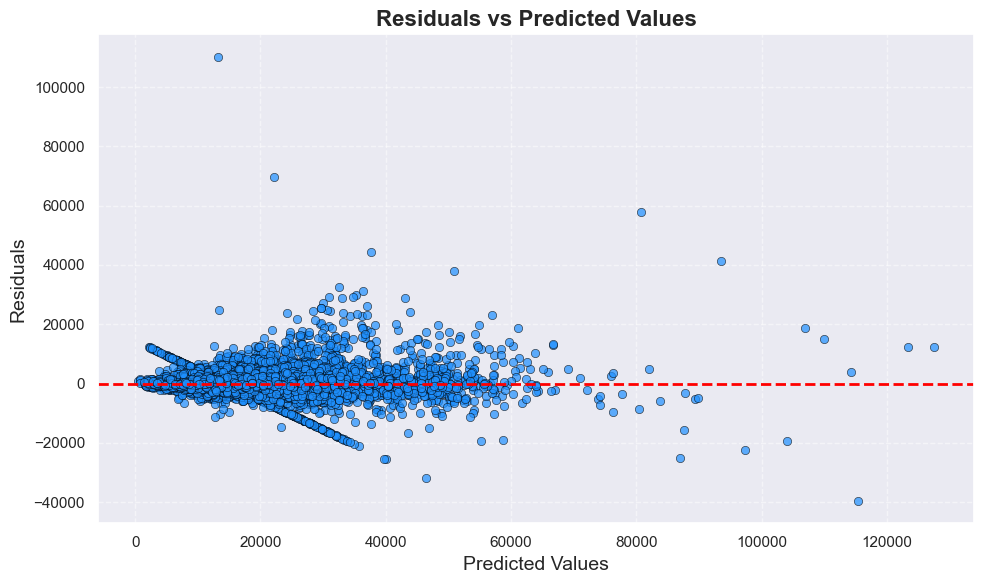

In [72]:
# 1. Predict on the test set
y_pred = model.predict(X_test)

# 2. Calculate residuals
residuals = y_test - y_pred

# 3. Plot: Residuals vs Predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.7, color='dodgerblue', edgecolor='black')
plt.axhline(0, color='red', linestyle='--', linewidth=2)
plt.title("Residuals vs Predicted Values", fontsize=16, fontweight='bold')
plt.xlabel("Predicted Values", fontsize=14)
plt.ylabel("Residuals", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [73]:
# Perform 5-fold cross-validation using R² (default for regression)
scores = cross_val_score(model, X, y, cv=5, scoring='r2')

# Display results
print("Cross-Validation R² Scores:", scores)
print("Mean R² Score:", np.mean(scores))
print("Standard Deviation:", np.std(scores))


Cross-Validation R² Scores: [0.94294269 0.93005114 0.94349602 0.94075519 0.94197368]
Mean R² Score: 0.9398437427574106
Standard Deviation: 0.004984073416081037


## 10. Conclusion

In this project, I performed a comprehensive exploration of car price prediction using a variety of regression models. A total of **9 different models** were evaluated, including Linear Regression, Ridge, Lasso, ElasticNet, SVR, Decision Tree, Random Forest, Gradient Boosting, and **XGBoost**. Among these, **XGBoost** consistently outperformed the others, achieving the following baseline metrics:

- **Mean Absolute Error (MAE):** 1860.12  
- **Root Mean Squared Error (RMSE):** 3313.98  
- **R² Score:** 0.8823  

To further enhance predictive accuracy, I applied **hyperparameter tuning** via **Randomized Search** on the XGBoost model. This optimization yielded significant performance improvements:

- **MAE improved to:** 1697.24  
- **RMSE improved to:** 3139.66  
- **R² Score improved to:** 0.8943  

These results highlight the critical role of hyperparameter tuning in improving model accuracy and generalization capabilities. The tuned XGBoost model demonstrates robust and reliable car price predictions, making it the most suitable choice for this regression task.

>### Key Takeaways:
>- Thorough feature engineering and exploratory data analysis helped identify the most impactful predictors.  
>- Evaluating a diverse set of regression models provided valuable insights into their strengths and weaknesses.  
>- Hyperparameter tuning proved essential for unlocking the full potential of complex models like XGBoost.  
>- The final tuned model can be effectively leveraged for accurate price prediction, market trend analysis, and strategic decision-making within the automotive industry.

Overall, this project presents a practical end-to-end workflow for regression problems involving real-world datasets and emphasizes how advanced ensemble techniques, combined with systematic tuning, can achieve state-of-the-art predictive performance.
